In [1]:
!pip install ultralytics
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install opencv-python numpy matplotlib torch torchvision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.8/978.8 kB 30.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 3.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 5.8 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.6 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.8.93
    Uninstalling nvidia-nvjitlink-cu12-12.8.93:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.8.93
  Attempting uninstall: nvidia-curand-cu12
    Found existing

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import torch
import os

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
# Load YOLOv8 model (pre-trained on COCO dataset)
yolo_model = YOLO('yolov8l.pt') # Use 'yolov8l.pt' for better accuracy and more detailed detection

100%|██████████| 83.7M/83.7M [00:00<00:00, 345MB/s]


In [4]:
import matplotlib.pyplot as plt
import numpy as np

def get_yolo_bboxes(image_path, model, conf_threshold=0.2):
    """Run YOLOv8 to get bounding boxes with lower confidence threshold for more detections."""
    results = model(image_path, conf=conf_threshold)
    bboxes = []
    for result in results:
        boxes = result.boxes.xyxy.cpu().numpy() # Bounding boxes in [x1, y1, x2, y2] format
        scores = result.boxes.conf.cpu().numpy() # Confidence scores
        classes = result.boxes.cls.cpu().numpy() # Class IDs
        for box, score, cls in zip(boxes, scores, classes):
            bboxes.append({'box': box, 'score': score, 'class': cls})
    return bboxes

def get_mask_bbox(mask):
    """Compute the bounding box of a segmentation mask."""
    # Find non-zero pixels in the mask
    y, x = np.where(mask)
    if len(x) == 0 or len(y) == 0: # Skip empty masks
        return None
    x1, x2 = x.min(), x.max()
    y1, y2 = y.min(), y.max()
    return [x1, y1, x2, y2]

def plot_original_image(image):
    """Plot and save the original image."""
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.axis('off')
    plt.savefig('original_image.png', bbox_inches='tight')
    plt.show()

def plot_yolo_bboxes(image, bboxes, class_names):
    """Plot and save the image with YOLO bounding boxes."""
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    for bbox in bboxes:
        box = bbox['box']
        cls = int(bbox['class'])
        score = bbox['score']
        x1, y1, x2, y2 = box
        rect = plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, edgecolor='red', linewidth=2)
        plt.gca().add_patch(rect)
        plt.text(x1, y1-10, f'{class_names[cls]} {score:.2f}', color='red', fontsize=12, bbox=dict(facecolor='white', alpha=0.8))
    plt.axis('off')
    plt.savefig('yolo_bboxes.png', bbox_inches='tight')
    plt.show()



image 1/1 /kaggle/input/sea-vqa-thailand/thailand_12436.jpeg: 480x640 22 persons, 1 handbag, 1 chair, 2 beds, 49.5ms
Speed: 10.1ms preprocess, 49.5ms inference, 301.4ms postprocess per image at shape (1, 3, 480, 640)


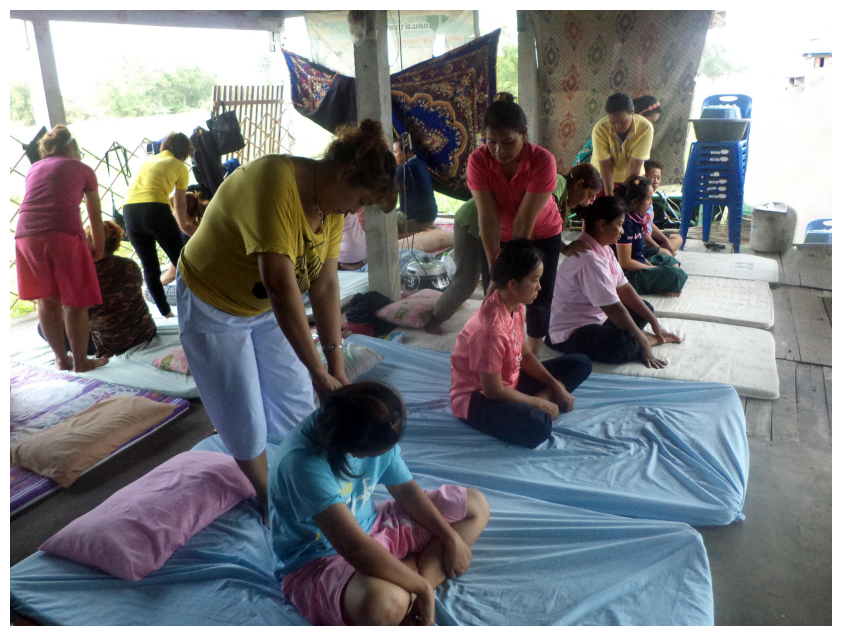

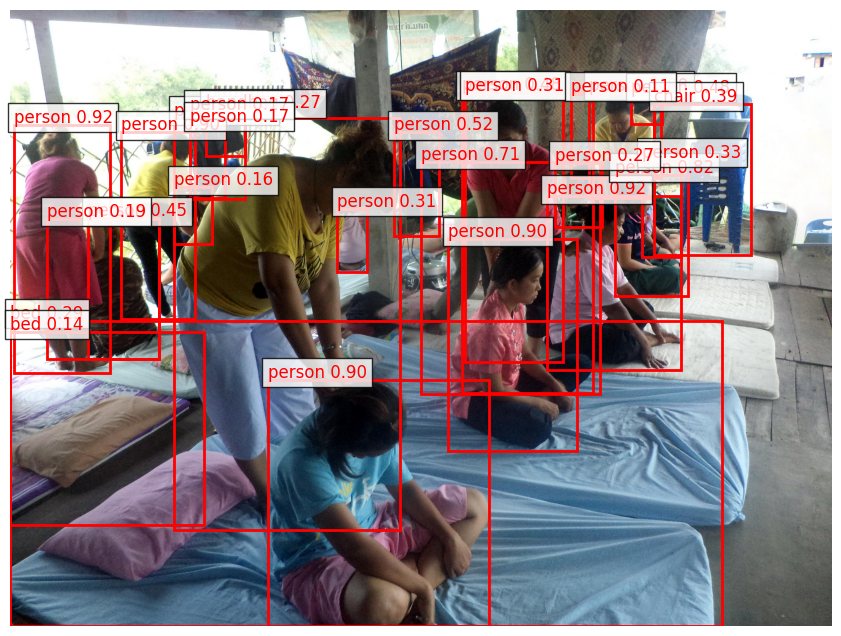

In [5]:
# Load image
image_path = '/kaggle/input/sea-vqa-thailand/thailand_12436.jpeg'
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Get YOLO bounding boxes
bboxes = get_yolo_bboxes(image_path, yolo_model, conf_threshold=0.1)

# Get class names from YOLO model
class_names = yolo_model.names

# Plot and save all images
plot_original_image(image_rgb)
plot_yolo_bboxes(image_rgb, bboxes, class_names)

In [6]:
def plot_image(image_path):
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Get YOLO bounding boxes
    bboxes = get_yolo_bboxes(image_path, yolo_model, conf_threshold=0.1)
    
    # Get class names from YOLO model
    class_names = yolo_model.names
    
    # Plot and save all images
    plot_original_image(image_rgb)
    plot_yolo_bboxes(image_rgb, bboxes, class_names)


image 1/1 /kaggle/input/sea-vqa-thailand/thailand_15310.jpeg: 448x640 24 persons, 1 cup, 42.3ms
Speed: 2.5ms preprocess, 42.3ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


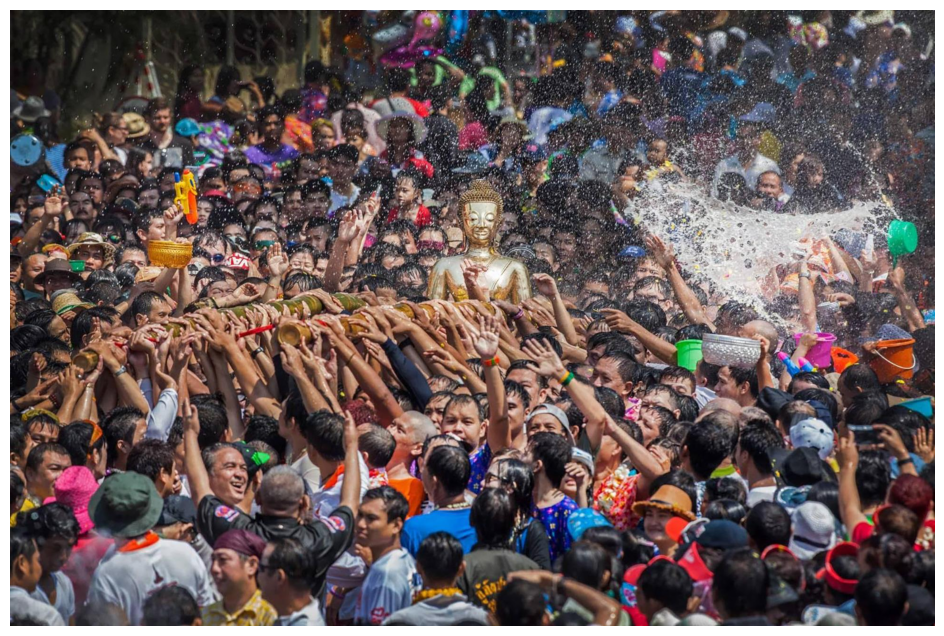

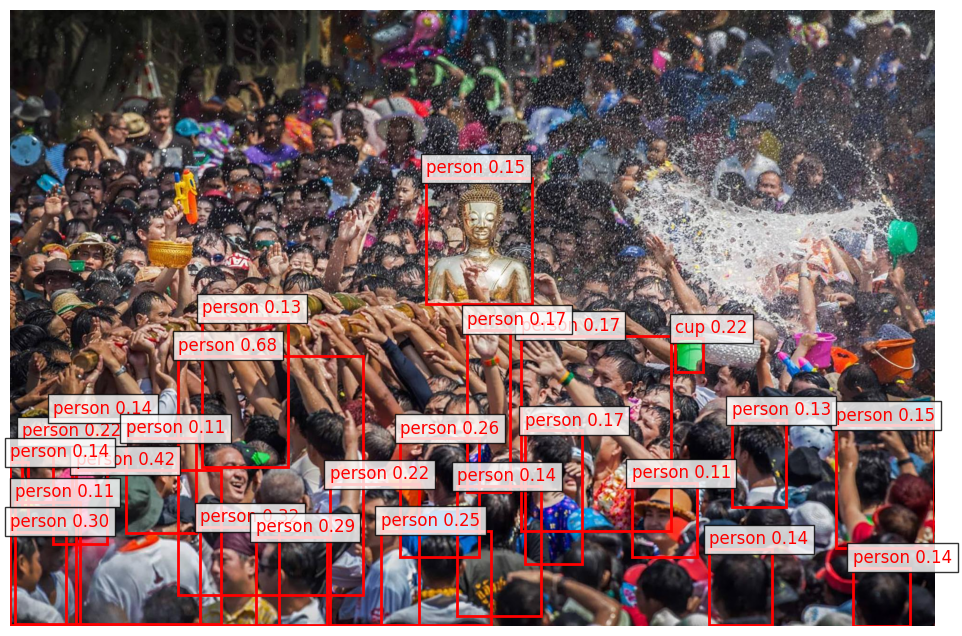

In [7]:
plot_image('/kaggle/input/sea-vqa-thailand/thailand_15310.jpeg')


image 1/1 /kaggle/input/sea-vqa-thailand/thailand_14181.jpeg: 640x448 1 person, 6 kites, 43.5ms
Speed: 3.4ms preprocess, 43.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 448)


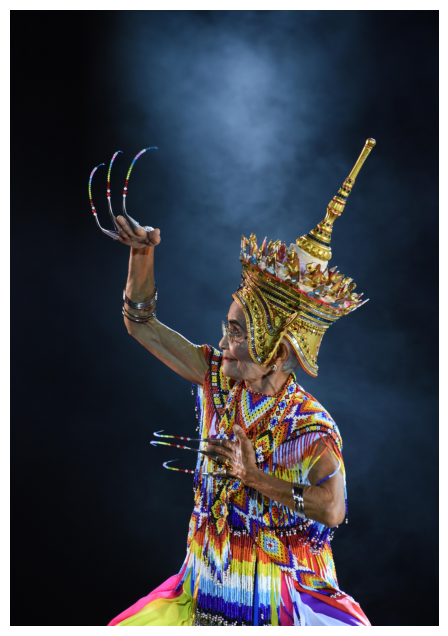

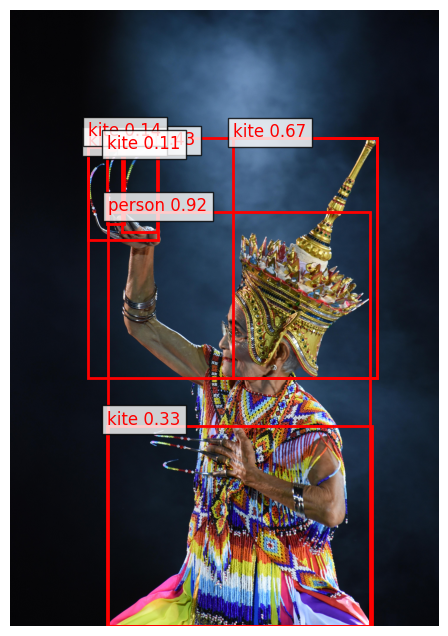

In [8]:
plot_image('/kaggle/input/sea-vqa-thailand/thailand_14181.jpeg')


image 1/1 /kaggle/input/sea-vqa-thailand/thailand_15309.jpeg: 448x640 24 persons, 1 bench, 1 backpack, 5 handbags, 7 bottles, 2 cups, 20.9ms
Speed: 2.5ms preprocess, 20.9ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)


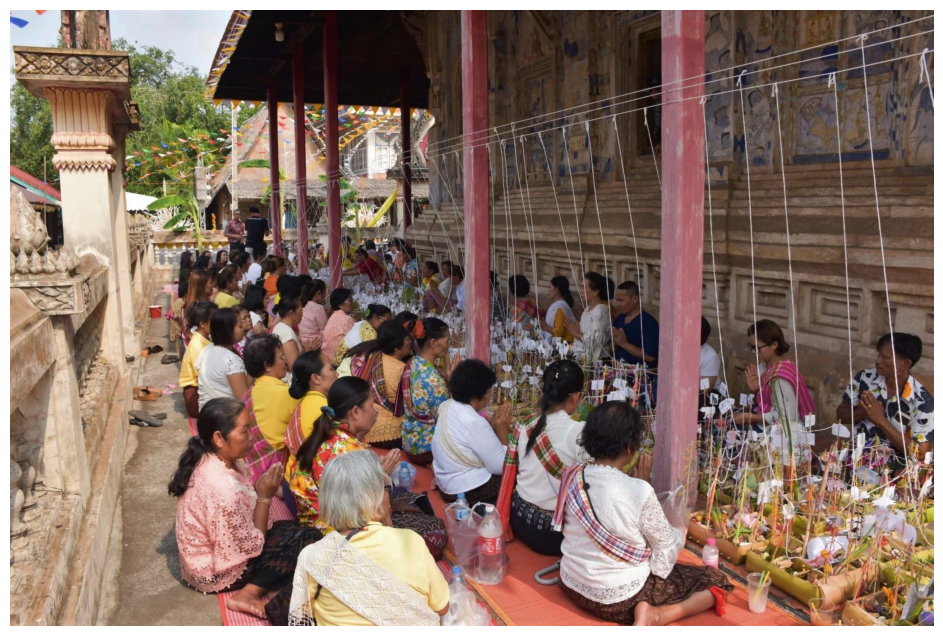

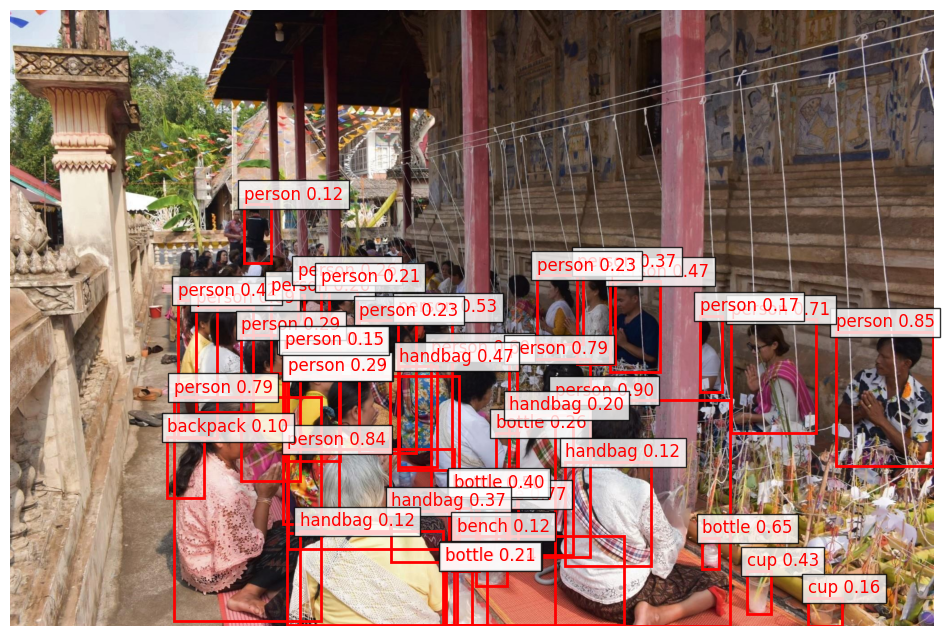

In [9]:
plot_image('/kaggle/input/sea-vqa-thailand/thailand_15309.jpeg')


image 1/1 /kaggle/input/sea-vqa-thailand/thailand_15316.jpeg: 448x640 23 persons, 5 cars, 3 handbags, 1 sports ball, 3 kites, 1 bottle, 2 cups, 2 cakes, 4 chairs, 1 dining table, 20.0ms
Speed: 2.8ms preprocess, 20.0ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


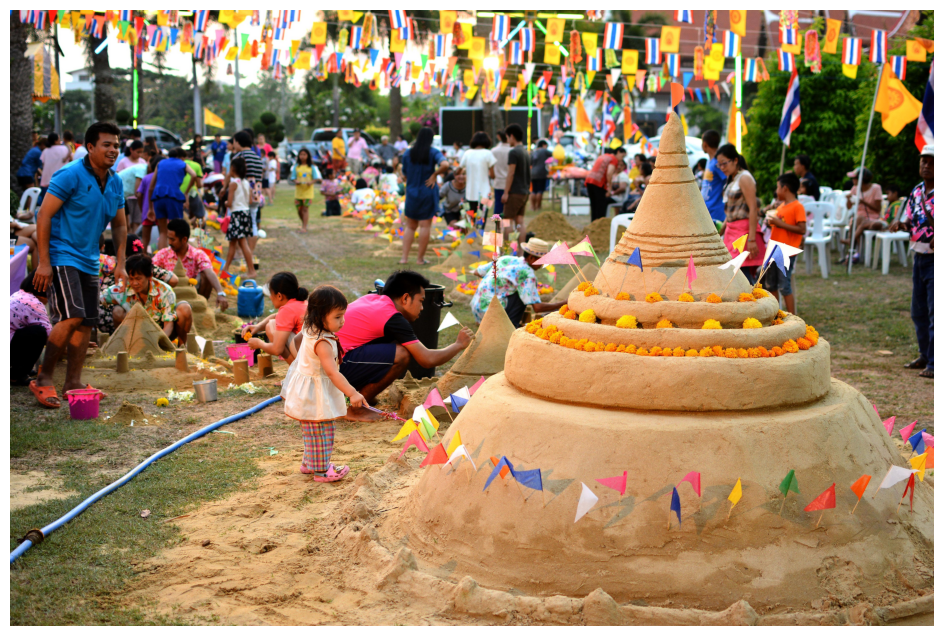

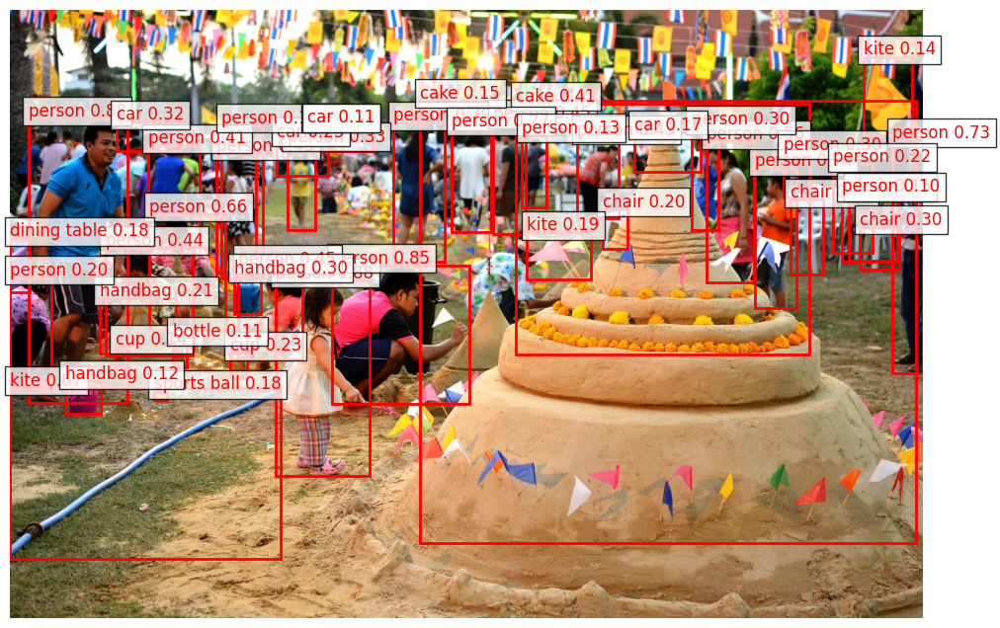

In [10]:
plot_image('/kaggle/input/sea-vqa-thailand/thailand_15316.jpeg')